# DeepDish: a Chicago food violation analysis.

## NB:
### As we use folium (interactive maps) the output are not shown in the notebook on github. Then we invite you to follow this nbviewer link to view all the plots: https://nbviewer.jupyter.org/github/adr1anh/DeepDish/blob/master/chicago_project.ipynb

In [71]:
import math
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import json
import time
from decimal import Decimal
from folium import plugins
import geopy
from geopy.geocoders import Nominatim
import statsmodels
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
sns.set_style('darkgrid')

In [2]:
data=pd.read_csv('data/food-inspections.csv')

In [3]:
data.columns

Index(['Inspection ID', 'DBA Name', 'AKA Name', 'License #', 'Facility Type',
       'Risk', 'Address', 'City', 'State', 'Zip', 'Inspection Date',
       'Inspection Type', 'Results', 'Violations', 'Latitude', 'Longitude',
       'Location', 'Historical Wards 2003-2015', 'Zip Codes',
       'Community Areas', 'Census Tracts', 'Wards'],
      dtype='object')

We keep only the columns of interest.

In [4]:
data=data[['Inspection ID','DBA Name','AKA Name','Facility Type','Risk','Inspection Date','Inspection Type', 'Results', 'Violations','Address', 'Latitude', 'Longitude', 'Zip']]
data.head()

,Inspection ID,DBA Name,AKA Name,Facility Type,Risk,Inspection Date,Inspection Type,Results,Violations,Address,Latitude,Longitude,Zip
0,2345323,ARMAND'S PIZZERIA,ARMAND'S PIZZERIA,Restaurant,Risk 1 (High),2019-11-08T00:00:00.000,License,Pass w/ Conditions,"3. MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL E...",29 N WACKER DR,41.882700,-87.636638,60606.0
1,2345321,GOPUFF,GOPUFF,Grocery Store,Risk 3 (Low),2019-11-08T00:00:00.000,License Re-Inspection,Pass,NaN,1801 W WARNER AVE,41.956846,-87.674395,60613.0
2,2345325,TACO MAX MEXICAN GRILL,TACO MAX MEXICAN GRILL,Restaurant,Risk 1 (High),2019-11-08T00:00:00.000,License,Pass w/ Conditions,"3. MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL E...",3402 W MONTROSE AVE,41.961238,-87.713284,60618.0
3,2345370,CAFE BALLOU,CAFE BALLOU & DELI,Restaurant,Risk 1 (High),2019-11-08T00:00:00.000,Canvass,No Entry,NaN,939 N WESTERN AVE,41.898706,-87.686773,60622.0
4,2345376,GARIBAY POULTRY,GARIBAY POULTRY,CUSTOM POULTRY SLAUGHTER,Risk 2 (Medium),2019-11-08T00:00:00.000,Complaint,Pass,47. FOOD & NON-FOOD CONTACT SURFACES CLEANABLE...,2100 S CALIFORNIA AVE,41.853688,-87.695652,60608.0


In [5]:
#We drop the duplicates
print('Number of rows in the original dataset:', len(data))
data=data.drop_duplicates()
print('Number of rows in the dataset without duplicates:', len(data))

Number of rows in the original dataset: 195796
Number of rows in the dataset without duplicates: 195555


We check the proportion of NaN for each column.

In [6]:
# Number of NaN per column.
data.isna().sum()

Inspection ID          0
DBA Name               0
AKA Name            2454
Facility Type       4774
Risk                  73
Inspection Date        0
Inspection Type        1
Results                0
Violations         51870
Address                0
Latitude             686
Longitude            686
Zip                   50
dtype: int64

Text(0.5, 1.0, 'Proportions of missing value')

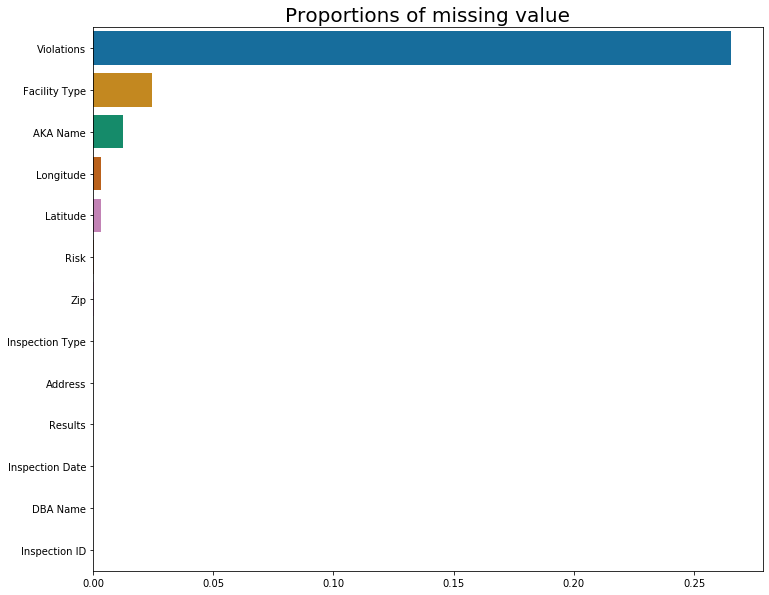

In [7]:
plt.figure(figsize=(12,10))
sns.barplot(x=data.isnull().sum().sort_values(ascending=False)/len(data),y=data.isnull().sum().sort_values(ascending=False).index,palette='colorblind')
plt.title("Proportions of missing value",size=20)

#### We replace the NaN values in AKA Name by the values in the DBA Name.

In [8]:
data['Name']=data['AKA Name'].fillna(data['DBA Name'])

#### We clean the Inspection Date column.

In [9]:
data['Inspection Date']=data['Inspection Date'].apply(lambda x: (x.split('T')[0]).split('-'))
# Create 3 new columns that contains respectively the year, the month and the day of each inspection.
data['year']=data['Inspection Date'].apply(lambda x: x[0])
data['month']=data['Inspection Date'].apply(lambda x: x[1])
data['day']=data['Inspection Date'].apply(lambda x: x[2])

#### Risk column: we merge 'All' and 'Risk 1'.

In [10]:
data["Risk"] = data["Risk"].replace(to_replace =["All"], value =["Risk 1 (High)"]) 

As it is an ordinal variable In the section C.1 we convert them to an int value.

#### We clean the Inspection Type column.

In [11]:
# Replace the NaN values by 'no type'.
data['Inspection Type']=data['Inspection Type'].fillna('no type')
# Convert capital letters to lower case.
data['Inspection Type']=data['Inspection Type'].apply(lambda x: x.lower())
# Determine all the inspection types in the dataframe.
inspec=data['Inspection Type'].unique()
inspec_count=data['Inspection Type'].value_counts()
print('Number of Inspection Types: ', len(inspec_count))
print('Number of Inspection Types with less than 10 occurence: ', len(inspec_count[inspec_count<10]))
display(inspec_count.to_frame())


Number of Inspection Types:  97
Number of Inspection Types with less than 10 occurence:  72


,Inspection Type
canvass,103294
license,25872
canvass re-inspection,20572
complaint,18132
license re-inspection,8960
...,...
license daycare 1586,1
changed court date,1
license task 1474,1
sfp recently inspected,1


We see that we have to regroup the inspection types.

In [12]:
def regroup_labels(all_labels,selected_labels,other=False):
    """
    INPUT: -all_labels (list): list of all the labels.
           -selected_labels (list): list of the generic labels we want to merge smaller labels with.
           -other (Boolean): if True convert all the remaining labels into 'other'.
    OUTPUT: -dico (dictionnary): dictionnary that associates labels with a greater generic label.
    
    """
    dico=dict()
    for words in all_labels:
        for label in selected_labels:
            if label in words:
                dico[words]=label
    if other:
        regroup_other(dico,all_labels)
    return dico

def regroup_other(dico,all_labels):
    """
    Convert all the labels that are not in the dictionnary into 'other'
    INPUT: -dico (dictionnary): dictionnary that associates labels with a greater generic label.
           -all_labels (list): list of all the labels.
    """
    for words in all_labels:
        if words not in dico:
            dico[words]='other'

def replace_label(dico,all_labels,words_to_replace,label,other=False):
    """
    Link all the labels that contains certain words with a generic label.
    INPUT: -dico (dictionnary): dictionnary that associates labels with a greater generic label.
           -all_labels (list): list of all the labels.
           -words_to_replace (list): list of words that appears in the label we want to replace.
           -label (string): label that replace all the labels which contains one of the string in words_to_replace.
    """
    for words in all_labels:
        for w in words_to_replace:
            if w in words:
                dico[words]=label

In [13]:
all_labels_inspec=inspec
# All the inspection types label we want to keep.
selected_labels=['tag removal ','consultation', 'out of business','complaint', 'canvass', 'fire', 'license', 'liquor', 'food poisoning', 'consultation']
# Create a dictionnary to merge all the similar types.
dico_inspec=regroup_labels(all_labels_inspec,selected_labels,other=True)
replace_label(dico_inspec,all_labels_inspec,['canvas'],'canvass')
replace_label(dico_inspec,all_labels_inspec,['o.b.','business'],'out of business')
replace_label(dico_inspec,all_labels_inspec,['liqour'],'liquor')
replace_label(dico_inspec,all_labels_inspec,['sick'],'food poisoning')
# Apply this dictionnary to the dataframe.
data['Inspection Type'].replace(dico_inspec).value_counts().to_frame()

,Inspection Type
canvass,123872
license,35470
complaint,32406
other,1139
food poisoning,1041
consultation,689
fire,321
out of business,309
liquor,308


#### Clean Facility type

In [14]:
facility_count=data['Facility Type'].value_counts()
display(facility_count[0:15].to_frame())
print('Number of facility type: ', len(facility_count))
print('Number of facility type with less than 100 occurences: ', len(facility_count[facility_count<100]))

,Facility Type
Restaurant,130369
Grocery Store,24898
School,12092
Children's Services Facility,3076
Bakery,2863
Daycare (2 - 6 Years),2688
Daycare Above and Under 2 Years,2368
Long Term Care,1349
Catering,1191
Mobile Food Dispenser,869


Number of facility type:  488
Number of facility type with less than 100 occurences:  463


In [15]:
# Replace NaN to the string 'no type'.
data['Facility Type']=data['Facility Type'].fillna('no type')
# Convert strings to lower case.
data['Facility Type']=data['Facility Type'].apply(lambda x: x.lower())
facility=data['Facility Type'].unique()
all_labels=facility
# All the labels we want to keep.
selected_labels=['restaurant','care','mobile','store','bakery','school','catering','no type']
# Create a dictionnary to merge the simmilar types.
dico_facility=regroup_labels(all_labels,selected_labels)
replace_label(dico_facility,all_labels,['child','nurs','assist'],'care')
replace_label(dico_facility,all_labels,['diner','tavern','bar','roof','hotel','brewery'],'restaurant')
replace_label(dico_facility,all_labels,['wholesale','gas','shop','grocery'],'store')
# Create merge all the other types together.
regroup_other(dico_facility,all_labels)
# Replace the Facility Type column in the dataframe by applying the dictionnary.
data['Facility Type'] = data['Facility Type'].replace(dico_facility)
data['Facility Type'].value_counts().to_frame()

,Facility Type
restaurant,131637
store,26383
school,12364
care,10845
no type,4774
other,3714
bakery,2886
mobile,1747
catering,1205


#### We clean the Zip column.

We scrap the missing Zip codes.

In [16]:
locator = Nominatim(user_agent="myGeocoder")
missing = data[data['Zip'].isna()][['Longitude','Latitude']]
lon_lat = []
location = []
zip_missing = []
# We get the longitude and the latitude of the rows with missing Zip.
for k in range(len(missing)):
    lon = missing['Longitude'].iloc[k]
    lat = missing['Latitude'].iloc[k]
    lon_lat.append((lon,lat))
# We get the exact address corresponding to the Latitude/Longitude.
for i in range(len(lon_lat)):
    lon=lon_lat[i][0]
    lat=lon_lat[i][1]
    if not (math.isnan(lon) or math.isnan(lat)):
        # We wait for 1.5 second between each query to avoid the 'Service Timed out error'.
        time.sleep(1.5)
        location.append(locator.reverse('{}, {}'.format(lat,lon)))
    else: 
        location.append(0)
# We extract the Zip code from these addresses.
for j in range(len(location)):
    if not location[j]==0:
        zip_missing.append(location[j][0].split(',')[-2].strip())
    else: zip_missing.append(math.nan)
indexes=missing.index
for (idx, zip_) in zip(indexes, zip_missing):
    data['Zip'].loc[idx] = zip_
display(data[data['Zip'].isna()])

C:\Users\marco\Desktop\Python\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


,Inspection ID,DBA Name,AKA Name,Facility Type,Risk,Inspection Date,Inspection Type,Results,Violations,Address,Latitude,Longitude,Zip,Name,year,month,day
70444,1763245,EAT N RUN CHICKEN AND FISH,EAT N RUN CHICKEN AND FISH,restaurant,Risk 1 (High),"[2016, 04, 19]",license,Not Ready,NaN,,NaN,NaN,NaN,EAT N RUN CHICKEN AND FISH,2016,04,19
124779,1106878,FILIPINO AMERICAN COUNCIL,RIZAL CENTER,restaurant,Risk 1 (High),"[2013, 09, 26]",canvass,Out of Business,NaN,1332 W DRIVING PARK ROAD BSMT,NaN,NaN,NaN,RIZAL CENTER,2013,09,26
191479,60405,CASA CENTRAL LA POSADA,CASA CENTRAL LA POSADA,restaurant,Risk 1 (High),"[2010, 04, 05]",canvass,Pass,37. TOILET ROOM DOORS SELF CLOSING: DRESSING R...,,NaN,NaN,NaN,CASA CENTRAL LA POSADA,2010,04,05


We notice that there are still 3 restaurant with no Zip as we don't have their latitude and longitude, we decide to drop them.

In [17]:
data=data[data['Zip'].notna()]

We look in the ditribution of the Zip codes.

Number of different Zip codes in the dataframe:  130
Number of Zip codes with less or equal than 5 establishments:  61


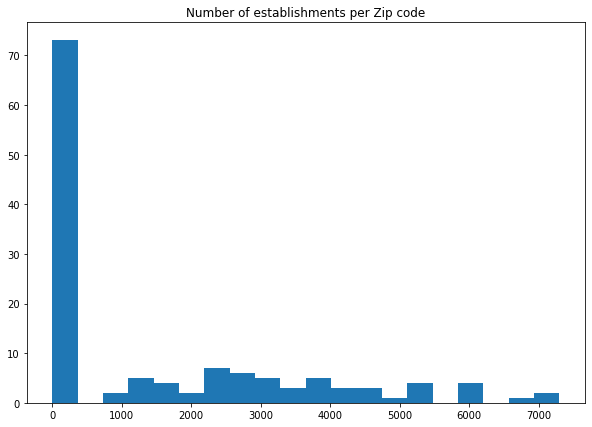

In [18]:
zip_count=data['Zip'].value_counts()
print('Number of different Zip codes in the dataframe: ', len(zip_count))
print('Number of Zip codes with less or equal than 5 establishments: ', len(zip_count[zip_count<=5]))
plt.figure(figsize=(10,7))
plt.hist(zip_count,bins=20)
plt.title('Number of establishments per Zip code')
plt.show()

We can see that roughly half of Zip codes have very few establishments and then it may be misleading to make conclusion on these districts.

#### Violations column

In [19]:
data['Violations'].iloc[1]

nan

An element of the Violation column is a large string containing all the violations that noted during the inspection with some comments. We want to create a list of violations for each inspection rather than a full string.

In [20]:
def get_list_violations(text,sep):
    """
    From the full text of the violations, create a list of violations without the comments.
    INPUT: -text (string): string in the violations column.
           -sep (string): string containing the separator between two violations.
    OUTPUT: -list_final (list): list of violations without comments.
    """
    text_low=text.lower()
    list1=text_low.split(sep)
    list_final=[]
    for words in list1:
        text2=words.split(' - ')[0].strip()
        text3='. '.join(text2.split('. ')[1:])
        list_final.append(text3)
    return list_final

def str_to_int(vec):
    """
    Create a dictionnary that associates an int to each violation.
    INPUT: -vec (array): array of strings containing the different types of violations.
    OUTPUT: -dico (dictionnary): dictionnary that associates for each violation an int.
    """
    k=1
    dico=dict()
    for words in vec:
        dico[words]=k
        k+=1
    return dico

def replace_list(vec,dico):
    """
    Replace each array of string to an array int.
    INPUT: -vec (array): array containing the strings we want to convert into int.
           -dico (dictionnary): dictionnary that associates for each string an int.
    OUTPUT: -new_vec (array): array of int corresponding to the input strings.
    """
    new_vec=[]
    for words in vec:
        if words in dico:
            new_vec.append(dico[words])
        else:
            new_vec.append(0)
    return new_vec
    

In [21]:
# We replace all the NaN by an empty string.
data['Violations']=data['Violations'].fillna('')
# We create a list of violations for each inspection.
data['processed Violations']=data['Violations'].apply(lambda x: get_list_violations(x,'|'))
# We enlist all the different violations.
violations=data.explode('processed Violations')['processed Violations'].unique()
# We create the dictionnary associating a violation to an int for better visualization.
dico_violations=str_to_int(violations)
data['Violations int']=data['processed Violations'].apply(lambda x: replace_list(x,dico_violations))

Let's consider only the dataset that contains non NA values for Longitude or Latitude.

We remove the rows with no Latitude and Longitude or Risk for the moment. If we have time, we will try to webscrap Longitude and Latitude by using the Adress column.

In [22]:
data_removed = data[-data[["Latitude","Longitude","Risk"]].isnull().any(axis = 1)]

In [23]:
data_removed.to_pickle('data/nb_data')

# B. Exploratory Data Analysis

### NB:
#### As we use folium (interactive maps) the output are not shown in the notebook on github. Then we invite you to follow this nbviewer link to view all the plots: https://nbviewer.jupyter.org/github/adr1anh/DeepDish/blob/master/chicago_project.ipynb

In this section, we visualize the cleaned data. We make plots centered around variables such as the risk level or the inspections as well as a heatmap to visualize the data geographically.

In [181]:
data_b = pd.read_pickle('data/nb_data')
data_removed = pd.read_pickle('data/nb_data')

## B.1 Inspections overview

This is the date the inspection occurred. A particular establishment is
likely to have multiple inspections which are denoted by different inspection dates. 


Here we make four plots. The first is a count of the number of inspections by year. The second is a count of the number of inspections by month, using data from all the years. The third plot shows the mean number of inspections depending on the establishment risk level and the fourth is a plot of the count of inspections over the years.

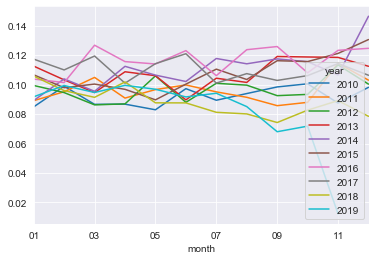

In [182]:
normalized_inspection_month = data_b.groupby(['year','month'])['Inspection ID'].agg('count').unstack('year')
normalized_inspection_month['month_sum'] = normalized_inspection_month.sum(axis = 1)
normalized_inspection_month
for column in normalized_inspection_month.columns[:-1]:
    normalized_inspection_month[column] = normalized_inspection_month[column] / normalized_inspection_month['month_sum']
normalized_inspection_month.drop(columns = ['month_sum'], inplace = True)
normalized_inspection_month.plot()

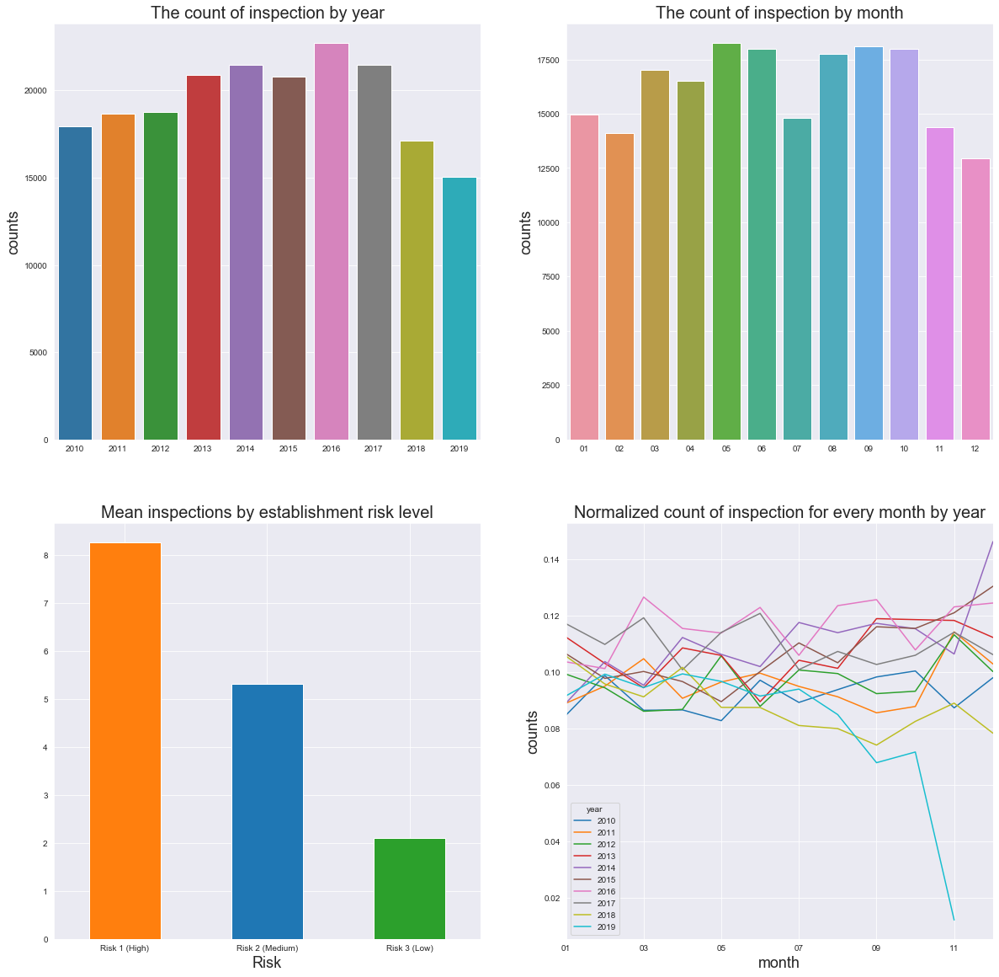

In [183]:
fig,ax=plt.subplots(2,2,figsize=(20,20))
x=data_b.year.value_counts().index
y=data_b.year.value_counts()
#Plot 1
sns.barplot(x=x,y=y,ax=ax[0,0])
ax[0,0].set_title("The count of inspection by year",size=20)
ax[0,0].set_ylabel('counts',size=18)
ax[0,0].set_xlabel('')

x=data_b.month.value_counts().index
y=data_b.month.value_counts()
#Plot 2
sns.barplot(x=x,y=y,ax=ax[0,1])
ax[0,1].set_title("The count of inspection by month",size=20)
ax[0,1].set_ylabel('counts',size=18)
ax[0,1].set_xlabel('')

colors = ['C1','C0','C2']
#Plot 3
mean_inspections = data_b.groupby(['Risk', 'DBA Name','Latitude','Longitude'])['Inspection ID'].agg('count').unstack('Risk').mean()
mean_inspections.plot(kind='bar', color = colors, ax = ax[1,0])
ax[1,0].set_title("Mean inspections by establishment risk level",size=20)
ax[1,0].tick_params(axis='x',labelrotation=360)
ax[1,0].set_xlabel('Risk', size= 18)

#Plot 4

normalized_inspection_month = data_b.groupby(['year','month'])['Inspection ID'].agg('count').unstack('year')
normalized_inspection_month['month_sum'] = normalized_inspection_month.sum(axis = 1)
normalized_inspection_month
for column in normalized_inspection_month.columns[:-1]:
    normalized_inspection_month[column] = normalized_inspection_month[column] / normalized_inspection_month['month_sum']
normalized_inspection_month.drop(columns = ['month_sum'], inplace = True)
normalized_inspection_month.plot(ax = ax[1,1])
ax[1,1].set_title("Normalized count of inspection for every month by year",size=20)
ax[1,1].set_ylabel('counts',size=18)
ax[1,1].set_xlabel('month',size=18)
plt.show()

# data_b.groupby(['year','month'])['Inspection ID'].agg('count').unstack('year').plot(ax=ax[1,1])
# ax[1,1].set_title("The counts of inspection for every month by year",size=20)
# ax[1,1].set_ylabel('counts',size=18)
# ax[1,1].set_xlabel('month',size=18)
# plt.show()


The first graph shows a spike in the number of inspections around the year 2016. The second and fourth plots indicate a drop in the inspection rate for the month of July. This drop can be the consequences of workers being on holiday break during the summer.

The third plot indicates that establishments which have had a high risk rating are more likely to be inspected again than those with a lower risk rating. This results is sensible as we expect the inspection authorities to re-investigate an establishment which has a high risk. 

## B.2 Risk overview

Each establishment is categorized as to its risk of adversely
affecting the public’s health, with 1 being the highest and 3 the lowest. The frequency of
inspection is tied to this risk, with risk 1 establishments inspected most frequently and
risk 3 least frequently. 

For a quick study of the risks we have the following plots. For the first plot the data is grouped by establishment, so as not to count muptiple occurences of the same establishment.

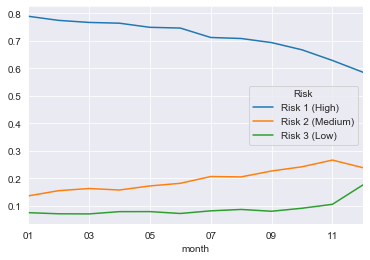

In [184]:
normalized_risk_month = data_b.groupby(['month','Risk'])['Inspection ID'].agg('count').unstack('Risk')
normalized_risk_month['month_sum'] = normalized_risk_month.sum(axis = 1)
normalized_risk_month
for column in normalized_risk_month.columns[:-1]:
    normalized_risk_month[column] = normalized_risk_month[column] / normalized_risk_month['month_sum']
normalized_risk_month.drop(columns = ['month_sum'], inplace = True)
normalized_risk_month.plot()
plt.show()

In [185]:
data_b.groupby(['month','Risk'])['Inspection ID'].agg('count').unstack('Risk')

Risk,Risk 1 (High),Risk 2 (Medium),Risk 3 (Low)
month,,,
01,11808,2027,1117
02,10938,2184,997
03,13062,2769,1194
04,12633,2597,1296
05,13679,3139,1434
06,13433,3265,1290
07,10540,3051,1203
08,12575,3635,1533
09,12559,4098,1445


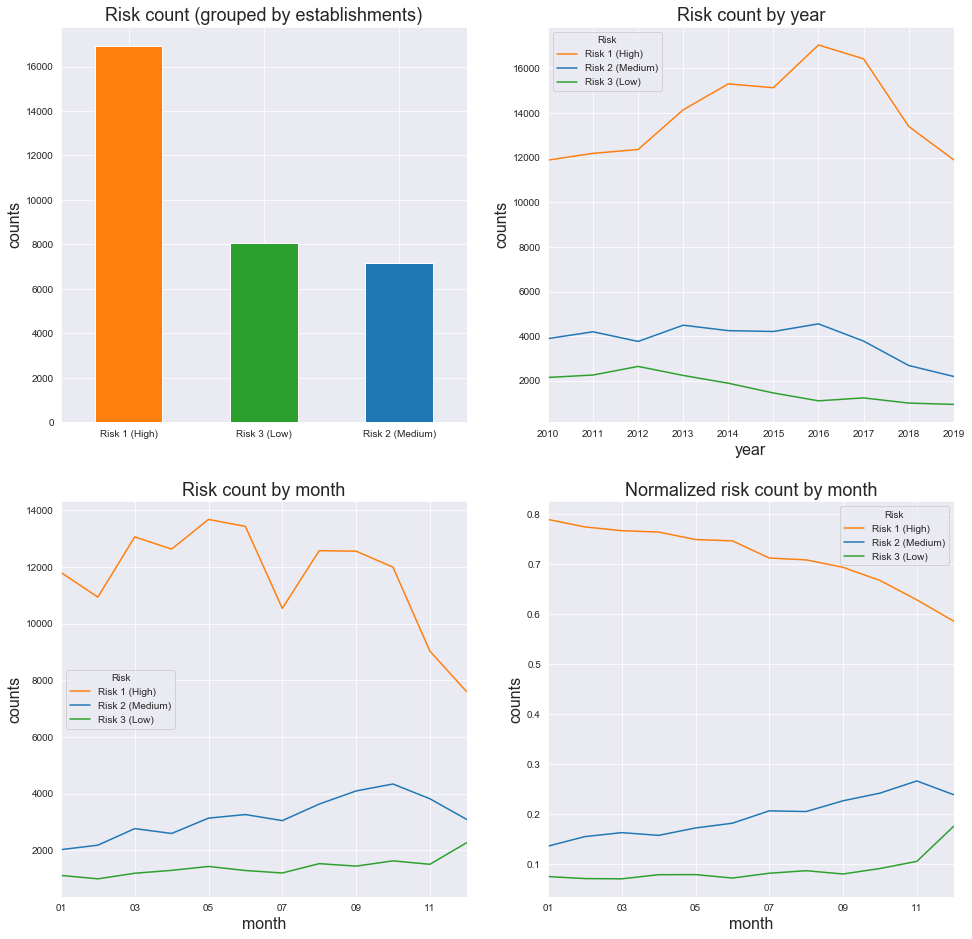

In [186]:
colors = ['C1','C0','C2']
fig,ax=plt.subplots(2,2,figsize=(16,16))
risk_count = data_b.groupby(['DBA Name','Latitude','Longitude','Risk'])['Inspection ID'].count().to_frame().reset_index()['Risk'].value_counts()
#Plot 1
risk_count.plot(kind = 'bar', color= ['C1','C2','C0'], ax = ax[0,0])
ax[0,0].tick_params(axis='x',labelrotation=360)
ax[0,0].set_title("Risk count (grouped by establishments)",size=18)
ax[0,0].set_ylabel('counts',size=16)

#Plot 2
data_b.groupby(['year','Risk'])['Inspection ID'].agg('count').unstack('Risk').plot(ax = ax[0,1], color = colors)
ax[0,1].set_title("Risk count by year",size=18)
ax[0,1].set_ylabel('counts',size=16)
ax[0,1].set_xlabel('year',size=16)

#Plot 3
data_b.groupby(['month','Risk'])['Inspection ID'].agg('count').unstack('Risk').plot(ax = ax[1,0], color = colors)
ax[1,0].set_title("Risk count by month",size=18)
ax[1,0].set_ylabel('counts',size=16)
ax[1,0].set_xlabel('month',size=16)

#Plot 4

normalized_risk_month = data_b.groupby(['month','Risk'])['Inspection ID'].agg('count').unstack('Risk')
normalized_risk_month['month_sum'] = normalized_risk_month.sum(axis = 1)
normalized_risk_month
for column in normalized_risk_month.columns:
    normalized_risk_month[column] = normalized_risk_month[column] / normalized_risk_month['month_sum']
normalized_risk_month.drop(columns = ['month_sum'], inplace = True)
normalized_risk_month.plot(ax = ax[1,1], color = colors)
ax[1,1].set_title("Normalized risk count by month",size=18)
ax[1,1].set_ylabel('counts',size=16)
ax[1,1].set_xlabel('month',size=16)

# data_b.groupby(['day','Risk'])['Inspection ID'].agg('count').unstack('Risk').plot(ax = ax[1,1], color = colors)
# ax[1,1].set_title("Risk count by day",size=18)
# ax[1,1].set_ylabel('counts',size=16)
# ax[1,1].set_xlabel('day',size=16)

plt.show()

The first plot shows that the vast majority of establishments are considered as high risk while the risk that is less given is Medium Risk.

The second plot shows that the spike of inspections around the year 2016 (described in the previous sub-section) majorly resulted in the count of high risk establishments.
#Need comment for three and four

## B.3 Violation type Inspection

An establishment can receive one or more of 45 distinct violations (violation
numbers 1-44 and 70). For each violation number, the
requirement the establishment must meet in order for it to not receive a violation is
noted, followed by a specific description of the findings that caused the violation to be
issued. The violations are split into three categories: violations 1 to 14 are considered critical violations and
violations 15 to 29 are considered serious and then there is the rest.

However, on 7/1/2018, the Chicago Department of Public Health’s Food Protection unit has changed its definition of violations (see link below). From this date onward, the same columns exist and continue to be populated. The Violations column will still contain the violation number, description, and comments.

Since the violation number change in meaning, we restrict ourselves here to the dataset up to 7/1/2018 and analyse the occurences of those violation numbers.



http://dev.cityofchicago.org/open%20data/data%20portal/2018/06/29/food-violations-changes.html

In [187]:
data_b3 = data_b.copy()

In [188]:
def get_violation_numbers(text,sep = '|'):
    """
    From the full text of the violations, create a list of violations without the comments.
    INPUT: text (str): Raw 'Violation' column entry 
    OUTPUT: result (list): list of integers corresponding to violations
    """
    result=[]
    
    if len(text) == 0 :
        return result
    
    text_split= text.split(sep)
    code = text_split[0].split(sep = '.')[0]
    result.append(int(code))
    
    for string in text_split[1:]:
        code = string.split(sep = '.')[0].strip()
        result.append(int(code))   
    return result

def get_violation_risk(violation_codes):
    """
    From the list of violation numbers, we return an integer that is the violation risk.
    Input : list of violation numbers
    output : integer
    """
    if not set(range(1,15)).isdisjoint(violation_codes):
        return 3
    elif not set(range(15,30)).isdisjoint(violation_codes):
        return 2
    elif violation_codes == []:
        return 0
    else:
        return 1

Below we append a new column called 'Violation risk' with value 3 if 'Violation codes' contains a critical violation (1-14), 2 if it contains a serious violation (15-29) and no critical violations, 1 if there are no serious nor critical violations and 0 if the 'Violations' column entry is empty.


In [189]:

#append a new integer column for the risk where high risk corresponds to integer 3, medium to 2 and low to 1
data_b3["Risk_score"] = data_b3["Risk"].replace(to_replace =["Risk 3 (Low)", "Risk 2 (Medium)", "Risk 1 (High)"],  
                            value =[1,2,3]) 
#Here we subset the data, retaining only the inspections up to the date 7/1/2018.
data_b3 = data_b3.astype({'year' : int, 'month' : int, 'day' : int})
sub_2018 = data_b3['year'] <= 2017
sub_07_2018 = (data_b3['year'] == 2018) & (data_b3['month'].isin(['01','02','03','04','05','06']))
data_b3 = data_b3[sub_2018 | sub_07_2018].reset_index()

#We append a column containing a list of the violation numbers for a given inspection
data_b3['Violation codes']=data_b3['Violations'].apply(lambda x: get_violation_numbers(x))

#We append a new column called 'Violation risk'
data_b3['Violation risk'] = data_b3['Violation codes'].apply(lambda x: get_violation_risk(x))

print('The number of inspections up to 7/1/2018 is', data_b3.shape[0] )

The number of inspections up to 7/1/2018 is 172008


We see below that there are many inspections for which there is no violations (where 'Violation risk' = 0). This may be because there are missing entries for violations in the dataset or that no violations were actually found during the inspection.

In [190]:
print(data_b3['Violation risk'].value_counts())
print()
n_pass = data_b3[(data_b3['Violation risk'] == 0) & (data_b3['Results'] == 'Pass')].shape[0]
print("The number of inspections with no entry for 'violations' that have resulted in a 'pass' is", n_pass)

n_not_pass = data_b3[(data_b3['Violation risk'] == 0) & (data_b3['Results'] != 'Pass')].shape[0]
print("The number of inspections with no entry for 'violations' that have NOT resulted in a 'pass' is", n_not_pass)

1    79947
0    46137
2    23425
3    22499
Name: Violation risk, dtype: int64

The number of inspections with no entry for 'violations' that have resulted in a 'pass' is 21966
The number of inspections with no entry for 'violations' that have NOT resulted in a 'pass' is 24171


Among the inspections for which the violation entry is empty, we choose to keep those that resulted in a 'pass' and discard the rest.

In [191]:
data_b3.drop(data_b3[ (data_b3['Violation risk'] == 0) & (data_b3['Results'] != 'Pass') ].index , inplace=True)

In [192]:
data_b3['Facility Type'].value_counts()

restaurant    101094
store          20856
school         10420
care            8189
other           2752
bakery          2212
mobile          1182
catering         846
no type          286
Name: Facility Type, dtype: int64

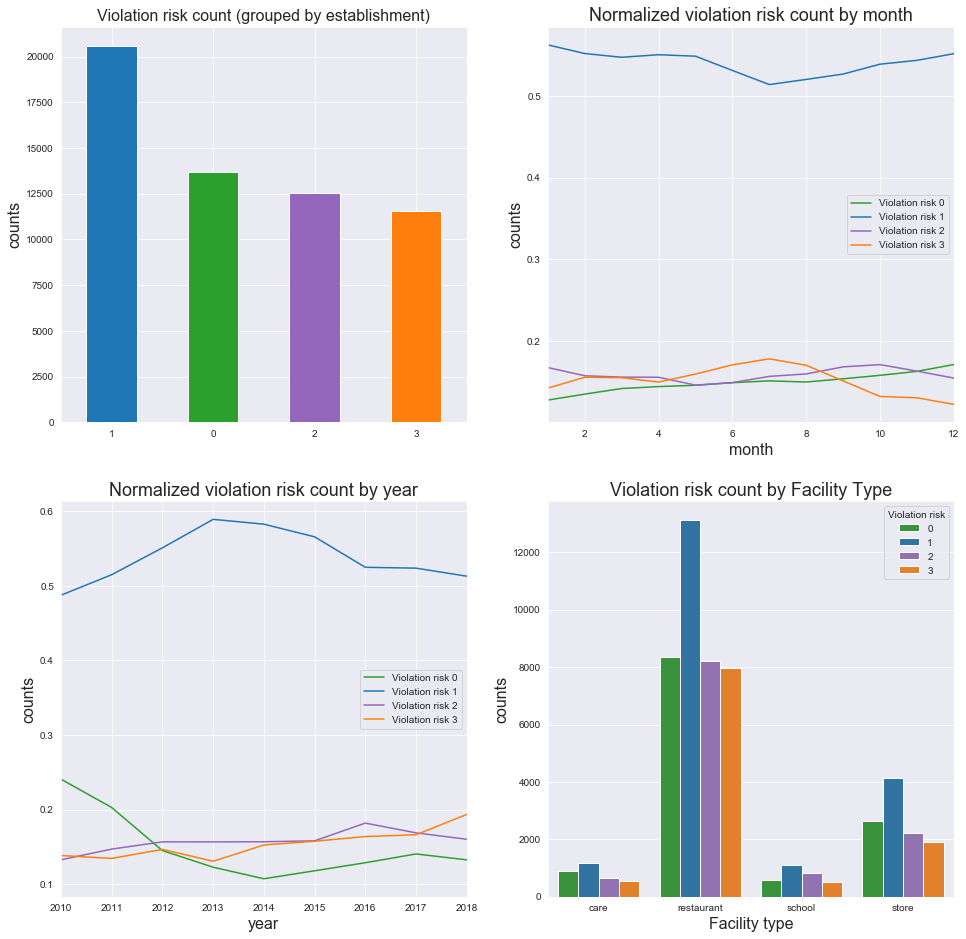

In [193]:
colors = ['C2','C0','C4','C1']
fig,ax=plt.subplots(2,2,figsize=(16,16))
risk_count = data_b3.groupby(['DBA Name','Latitude','Longitude','Violation risk'])['Inspection ID'].count().to_frame().reset_index()['Violation risk'].value_counts()
#Plot 1
risk_count.plot(kind = 'bar', color= [colors[1],colors[0],colors[2],colors[3]], ax = ax[0,0])
ax[0,0].tick_params(axis='x',labelrotation=360)
ax[0,0].set_title("Violation risk count (grouped by establishment)",size=16)
ax[0,0].set_ylabel('counts',size=16)

#Plot 2
violation_month_trend = pd.merge(data_b3.groupby(['month','Violation risk'])['Inspection ID'].count().reset_index().set_index('month'),\
         data_b3.groupby(['month'])['Inspection ID'].count(),\
         left_on='month', right_on='month', how='left') 
violation_month_trend['normalizedCount'] = violation_month_trend['Inspection ID_x'] /  violation_month_trend['Inspection ID_y']
violation_month_trend.drop(columns = ['Inspection ID_x','Inspection ID_y'], inplace = True)
violation_month_trend = violation_month_trend.reset_index().set_index(['month','Violation risk']).unstack('Violation risk')
violation_month_trend.columns = ['Violation risk 0','Violation risk 1','Violation risk 2','Violation risk 3']
violation_month_trend.plot(ax = ax[0,1], color = colors)
ax[0,1].set_title("Normalized violation risk count by month",size=18)
ax[0,1].set_ylabel('counts',size=16)
ax[0,1].set_xlabel('month',size=16)

#Plot 3
violation_year_trend = pd.merge(data_b3.groupby(['year','Violation risk'])['Inspection ID'].count().reset_index().set_index('year'),\
         data_b3.groupby(['year'])['Inspection ID'].count(),\
         left_on='year', right_on='year', how='left') 
violation_year_trend['normalizedCount'] = violation_year_trend['Inspection ID_x'] /  violation_year_trend['Inspection ID_y']
violation_year_trend.drop(columns = ['Inspection ID_x','Inspection ID_y'], inplace = True)
violation_year_trend = violation_year_trend.reset_index().set_index(['year','Violation risk']).unstack('Violation risk')
violation_year_trend.columns = ['Violation risk 0','Violation risk 1','Violation risk 2','Violation risk 3']
violation_year_trend.plot(ax = ax[1,0], color = colors)
ax[1,0].set_title("Normalized violation risk count by year",size=18)
ax[1,0].set_ylabel('counts',size=16)
ax[1,0].set_xlabel('year',size=16)

#Plot 4
facility_risk_proportion = data_b3[data_b3['Facility Type'].\
        isin(['restaurant','store','school','care'])].\
        groupby(['DBA Name','Latitude','Longitude','Facility Type','Violation risk'])['Inspection ID'].\
        count().reset_index()
facility_risk_proportion = facility_risk_proportion.groupby(['Facility Type','Violation risk'])['Inspection ID'].\
                            count().to_frame().reset_index()
sns.barplot(x = facility_risk_proportion['Facility Type'],\
            y = facility_risk_proportion['Inspection ID'], 
            hue = facility_risk_proportion['Violation risk'], palette= colors
            )
ax[1,1].set_title("Violation risk count by Facility Type",size=18)
ax[1,1].set_ylabel('counts',size=16)
ax[1,1].set_xlabel('Facility type',size=16)

plt.show()

## B.4 Heatmap of the establishments

In [194]:
def generateBaseMap(default_location=[data_removed["Latitude"][0],data_removed["Longitude"][0]],default_zoom_start=10):
    """Create a new folium map"""
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [195]:
#Create a data Frame containing each unique restaurant
name_data = data_removed.groupby(["AKA Name","Latitude","Longitude","year"])
#Count the number of inspections by restaurant
name_count = name_data["DBA Name"].count()
name_map = pd.DataFrame(name_count)
name_map = name_map.rename(columns={"DBA Name": "Count"})
name_map = name_map.reset_index()
name_map.head()

,AKA Name,Latitude,Longitude,year,Count
0,"#1 CHINA EXPRESS , LTD",41.816834,-87.631346,2010,1
1,"#1 CHINA EXPRESS , LTD",41.816834,-87.631346,2012,1
2,#1 CHOP SUEY,41.735578,-87.670781,2010,3
3,#1 CHOP SUEY,41.735578,-87.670781,2011,1
4,#1 CHOP SUEY,41.735578,-87.670781,2013,2


In [196]:
from folium.plugins import HeatMap
base_map = generateBaseMap()
HeatMap(data=data_removed[["Latitude","Longitude"]].groupby(["Latitude","Longitude"]).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(base_map)
base_map.save("Heatmap.html")

The saved map found on github(https://github.com/adr1anh/DeepDish/blob/master/Heatmap.html), gives us the exact location of each establishment plotted on the Chicago interactive map. This give us a first insight on the distribution of the establishments in the city. 

# C. Risk Analysis

Here we look more into the risk following two approaches: first we split the city by zip code areas, then we take a look a the data with respect to each risk level.

## C.1 Risk by Zip Code

In [197]:
#We transform this with numerical values as follows
data_removed["Risk_score"] = data_removed["Risk"].replace(to_replace =["Risk 3 (Low)", "Risk 2 (Medium)", "Risk 1 (High)"],  
                            value =[1,2,3]) 
data_removed.Risk_score = data_removed.Risk_score.astype(float)
data_removed["Risk_score"].value_counts()

3.0    139850
2.0     38023
1.0     16925
Name: Risk_score, dtype: int64

In [198]:
#Groupby ZIPS
zip_data = data_removed.groupby("Zip")
# Count number of failed exams
failed = data_removed[data_removed['Results'] == 'Fail'].groupby('Zip')["Results"].count()
failed_per = ((failed/zip_data.Results.count())*100)
# Look for most frequent facility 
fac = zip_data["Facility Type"].describe()
#High risk restaurant 
high_risk = data_removed.loc[data_removed['Risk_score'] == 3]
high_per = ((high_risk["Zip"].value_counts()/data_removed["Zip"].value_counts())*100)
#Low risk restaurant 
low_risk = data_removed.loc[data_removed['Risk_score'] == 1]
low_per = ((low_risk["Zip"].value_counts()/data_removed["Zip"].value_counts())*100)
#Add all features I can think of
mean_risk = zip_data.Risk_score.mean()
value_count = data_removed["Zip"].value_counts()
risk_map = pd.DataFrame(mean_risk)
risk_map["Count"] = value_count
risk_map["Fail"] = failed
risk_map["Percentage of Failed Exams"] = failed_per
risk_map["Percentage High Risk"] = high_per
risk_map["Percentage Low Risk"] = low_per
risk_map["Top Facility"] = fac.top.values
risk_map = risk_map.reset_index()
risk_map["Zip"] = risk_map["Zip"].astype(int)
risk_map = risk_map.fillna(0)
risk_map["Percentage High Risk"] = risk_map["Percentage High Risk"].astype(int)
risk_map["Percentage Low Risk"] = risk_map["Percentage Low Risk"].astype(int)
risk_map["Percentage of Failed Exams"] = risk_map["Percentage of Failed Exams"].astype(int)
risk_map.to_csv("Risk_study.csv")

As we can see the Zip codes defined above should not be considered for explanatory data analysis as they are clear outliers. Hence from the 109 Zips from the beggining we here work only with 60 of those which are mostly composed of restaurants.

We now use Folium to have nice plots with the value of our table defined above.

In [199]:
# load GeoJSON
with open('folium/Boundaries - ZIP Codes.geojson', 'r') as jsonFile:
    data_ = json.load(jsonFile)
tmp = data_

# remove ZIP codes not in our dataset
geozips = []
A=[]
for i in range(len(tmp['features'])):
    A.append(int((tmp['features'][i]['properties']['zip'])))
    if A[i] in (risk_map["Zip"].unique()):
        tmp['features'][i]['properties']['zip'] = int((tmp['features'][i]['properties']['zip']))
        geozips.append(tmp['features'][i])
        
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips

# save JSON object as updated-file
open("updated-file.json", "w").write(
    json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': '))
)

5939874

We have created a JSON file containing all information needed for our ZIP code that are given in our data and that can be found also in Boundaries - ZIP Codes.geojson. We get a dataset with 61 entries, better to find one with more ZIP.

In [200]:
def create_map(table, zips, mapped_feature, add_text = ''):
    # reading of the updated GeoJSON file
    geo = r'updated-file.json'
    # initiating a Folium map with Chicago's longitude and latitude
    coord = [data_removed["Latitude"][0],data_removed["Longitude"][0]]
    m = folium.Map(location = coord, tiles='cartodbpositron',zoom_start = 10)
    # creating a choropleth map
    m.choropleth(
        geo_data = geo,
        fill_opacity = 0.7,
        line_opacity = 0.2,
        data = table,
        # refers to which key within the GeoJSON to map the ZIP code to
        key_on = 'feature.properties.zip',
        # first element contains location information, second element contains feature of interest
        columns = [zips, mapped_feature],
        fill_color = 'BuPu',
        legend_name = (' ').join(mapped_feature.split('_')).title() + ' Number of facilites ' + add_text + ' Across Chigaco'
    )
    folium.LayerControl().add_to(m)
    # save map with filename based on the feature of interest
    m.save(outfile = mapped_feature + '_map.html')
    return(m)

In [201]:
# We can thus create maps with the given features
create_map(risk_map, 'Zip', 'Risk_score', 'of Facilities')

C:\Users\marco\Desktop\Python\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [202]:
create_map(risk_map, 'Zip', 'Count', 'of Facilities')

In [203]:
create_map(risk_map, 'Zip', 'Percentage of Failed Exams', 'of Facilities')

In [204]:
create_map(risk_map, 'Zip', "Percentage High Risk", 'of Facilities')

In [205]:
create_map(risk_map, 'Zip', "Percentage Low Risk", 'of Facilities')

We have now the following results:

In the count map found in the github (https://github.com/adr1anh/DeepDish/blob/master/Count_map.html), we can see that the majority of district have between 1200 and 3500 facilities. We can see that the district with the most facilities are all next to each other and centerd near uptown Chicago. We will now look more in detail which area are given the highest risk and which one actually fails more inspections.

In the map showing the mean risk in each Zip codes area found in the github (https://github.com/adr1anh/DeepDish/blob/master/Risk_score_map.html), we can see that the mean risk is pretty evenly distributed and high around a score of 2.5. This seems not such a good idea to plot the means and we will it the next plots study rather the percentage distribution. 

In the Percentage of High Risk establishment map found in the github (https://github.com/adr1anh/DeepDish/blob/master/Percentage%20High%20Risk_map.html), we can see that the vast majority of districts have between 70-80% of High Risk facilities, we can see that the districts with fewer facilities and further from the upper district of Chicago are also the one with a low percentage of high risk given facilities. Hence we can deduce that it is considered, the residential district have few riskier facilities but less options to eat.

In the Percentage of Low Risk establishment map found in the github (https://github.com/adr1anh/DeepDish/blob/master/Percentage%20Low%20Risk_map.html), we can see that there very few low risk facilities and they are spread evenly across district.

In the Percentage of failed tests Exams map found in the github (https://github.com/adr1anh/DeepDish/blob/master/Percentage%20of%20Failed%20Exams_map.html), we might have expected that the district with the highest count of restaurant who also have a percentage of high risk are not the ones with the highest percentage of failed inspections. The ones with the highest percentage of violation are around 30% and situated in the lower district of chicago, which are more residential but poorer districts.

## C.2 Deeper look for different risks

In [206]:
# We split the dataset by risk level
data_risk1 = data_removed[data_removed['Risk'] == 'Risk 1 (High)' ]
data_risk2 = data_removed[data_removed['Risk'] == 'Risk 2 (Medium)' ]
data_risk3 = data_removed[data_removed['Risk'] == 'Risk 3 (Low)' ]


### C.2.1 High risk

Below is an example code of the folium plugin we mainly wanted to use. It allows use to plot heatmaps on the map of Chicago with a slider for the time (in years). However we could not get the map to work, it only showed the plain Chicago map with no widgets for time control nor any points plotted.

This issue is probably from the package updates as we seem to have the exact same problem as the issue raised on these posts:

    https://github.com/python-visualization/folium/issues/1231

    https://github.com/python-visualization/folium/issues/1232

Below we plot a heatmap for the establishment that have received a high risk rating. The data plotted here is grouped by establishment so that there are no duplicate points. This map gives some insight as to the geographical location of high risk establishments. 

In [207]:
coord = [data_removed["Latitude"][0],data_removed["Longitude"][0]]
#Create a data Frame containing each unique restaurant
name_data = data_risk1.groupby(["AKA Name","Latitude","Longitude","year"])
#Count the number of inspections by restaurant
name_count = name_data["DBA Name"].count()
name_count = name_count.astype(int)
name_map = pd.DataFrame(name_count)
name_map = name_map.rename(columns={"DBA Name": "Count"})
name_map = name_map.reset_index()
name_map.head()

year_list=[]
for year in data_risk1.year.sort_values().unique():
    year_list.append(name_map.loc[name_map.year == year, ["Latitude","Longitude","Count"]].values.tolist())


#np.random.seed(3141592)

data = [ year_list[i][1:1050] for i in range(10)]
#weight = 1  # default value
#for time_entry in data:
#    for row in time_entry:
#        row.append(weight)
time_index = [ 2010+k for k in range(10)]
    
m = folium.Map(coord, tiles='stamentoner', zoom_start=12)

hm = plugins.HeatMapWithTime(
    data,
    index=time_index,
    auto_play=True,
    max_opacity=0.3
)

hm.add_to(m)

m

In [208]:
X=data_removed[data_removed["Violations"]==""]
X[X["Results"]=="No Entry"]

,Inspection ID,DBA Name,AKA Name,Facility Type,Risk,Inspection Date,Inspection Type,Results,Violations,Address,Latitude,Longitude,Zip,Name,year,month,day,processed Violations,Violations int,Risk_score
3,2345370,CAFE BALLOU,CAFE BALLOU & DELI,restaurant,Risk 1 (High),"[2019, 11, 08]",canvass,No Entry,,939 N WESTERN AVE,41.898706,-87.686773,60622,CAFE BALLOU & DELI,2019,11,08,[],[7],3.0
10,2345374,BAR MARTA,HERITAGE,restaurant,Risk 1 (High),"[2019, 11, 08]",canvass,No Entry,,2700 W CHICAGO AVE,41.895778,-87.694300,60622,HERITAGE,2019,11,08,[],[7],3.0
22,2345215,YOUNG SCHOLARS ACADEMY,YOUNG SCHOLARS ACADEMY,care,Risk 1 (High),"[2019, 11, 07]",license,No Entry,,10926-10928 S WESTERN AVE,41.694759,-87.681398,60643,YOUNG SCHOLARS ACADEMY,2019,11,07,[],[7],3.0
31,2345299,CEVICHE,CEVICHE,restaurant,Risk 1 (High),"[2019, 11, 07]",canvass,No Entry,,2554-2556 W DIVERSEY AVE,41.932242,-87.692559,60647,CEVICHE,2019,11,07,[],[7],3.0
39,2345301,"TABLE, DONKEY & STICK","TABLE, DONKEY & STICK",restaurant,Risk 1 (High),"[2019, 11, 07]",canvass,No Entry,,2728 W ARMITAGE AVE,41.917613,-87.695915,60647,"TABLE, DONKEY & STICK",2019,11,07,[],[7],3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151170,1230048,TAPAS LAS RAMBLAS,TAPAS LAS RAMBLAS,restaurant,Risk 1 (High),"[2012, 06, 05]",complaint,No Entry,,5101-5103 N CLARK ST,41.974421,-87.668067,60640,TAPAS LAS RAMBLAS,2012,06,05,[],[7],3.0
151526,1229216,KATSU ENTERPRISESES INC,KATSU JAPANESE RESTAURANT,restaurant,Risk 1 (High),"[2012, 05, 29]",canvass,No Entry,,2651 W PETERSON AVE,41.990349,-87.696652,60659,KATSU JAPANESE RESTAURANT,2012,05,29,[],[7],3.0
151562,1229215,CHICAGO FONDUE STUBE,CHICAGO FONDUE STUBE,restaurant,Risk 1 (High),"[2012, 05, 29]",canvass,No Entry,,2717 W PETERSON AVE,41.990342,-87.697701,60659,CHICAGO FONDUE STUBE,2012,05,29,[],[7],3.0
156126,671042,MAGNOLIA CAFE,MAGNOLIA CAFE,restaurant,Risk 1 (High),"[2012, 03, 01]",canvass,No Entry,,1224 W WILSON AVE,41.965461,-87.660641,60640,MAGNOLIA CAFE,2012,03,01,[],[7],3.0


In [209]:
#Functions for plotting.
def create_folium_map(data_, save_name =''):
    data = data_.groupby(['Latitude','Longitude','DBA Name'])['Inspection ID'].count().to_frame().reset_index()
    coord = [data['Latitude'].mean(), data['Longitude'].mean()]
    m = folium.Map(location=coord, tiles = 'Stamen Toner', zoom_start=10)
    to_plot = data[['Latitude', 'Longitude']].as_matrix()
    m.add_child(plugins.HeatMap(to_plot, radius=15))
    m.save(save_name + '.html')
    return m

def heatmap_plot(data_, color_ = 0):
    data = data_.groupby(['Latitude','Longitude','DBA Name'])['Inspection ID'].count().to_frame().reset_index()
    ax = sns.jointplot("Latitude", "Longitude", data=data, kind="kde", space=0, color= colors[color_], height=7)
    ax.fig.suptitle("Risk 1 (High)")
    plt.show()

In [210]:
data_risk1['Longitude'].mean()

-87.67675889404023

Here we create a folium map, saved under the name 'high_risk_map.html'.

In [211]:
create_folium_map(data_risk1, save_name='high_risk_map')

C:\Users\marco\Desktop\Python\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


Below is a non-interactive plot of the map above which allows to get a broader insight of the point distribution.

(As we saw that the HeatMapWithTime folium plug-in we explored alternative plots, one of which is the plot shown below however due to time constraints, we could not suceed yet in adding the chicago map as a background picture)

C:\Users\marco\Desktop\Python\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


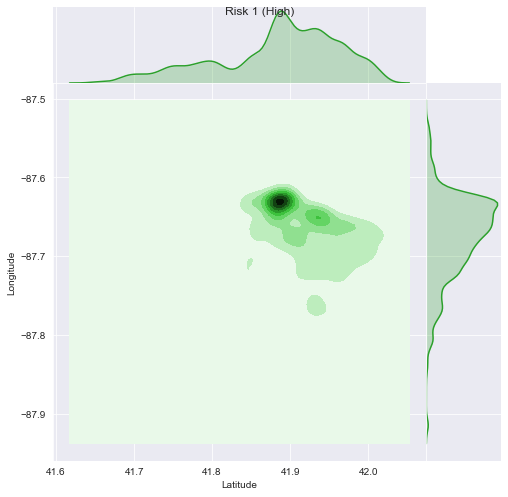

In [212]:
heatmap_plot(data_risk1)

### C.2.1 Medium risk

In [213]:
#Create a data Frame containing each unique restaurant
name_data = data_risk2.groupby(["AKA Name","Latitude","Longitude","year"])
#Count the number of inspections by restaurant
name_count = name_data["DBA Name"].count()
name_count = name_count.astype(int)
name_map = pd.DataFrame(name_count)
name_map = name_map.rename(columns={"DBA Name": "Count"})
name_map = name_map.reset_index()
name_map.head()

year_list=[]
for year in data_risk2.year.sort_values().unique():
    year_list.append(name_map.loc[name_map.year == year, ["Latitude","Longitude",]].values.tolist())


np.random.seed(3141592)

data = [ year_list[i][1:1050] for i in range(10)]
weight = 1  # default value
for time_entry in data:
    for row in time_entry:
        row.append(weight)
time_index = [ 2010+k for k in range(10)]
    
m = folium.Map(coord, tiles='stamentoner', zoom_start=12)

hm = plugins.HeatMapWithTime(
    data,
    index=time_index,
    auto_play=True,
    max_opacity=0.3
)

hm.add_to(m)

m

Here the same treatement as above is applied but on the medium risk establishments this time.

In [214]:
create_folium_map(data_risk2, save_name='medium_risk_map')

C:\Users\marco\Desktop\Python\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


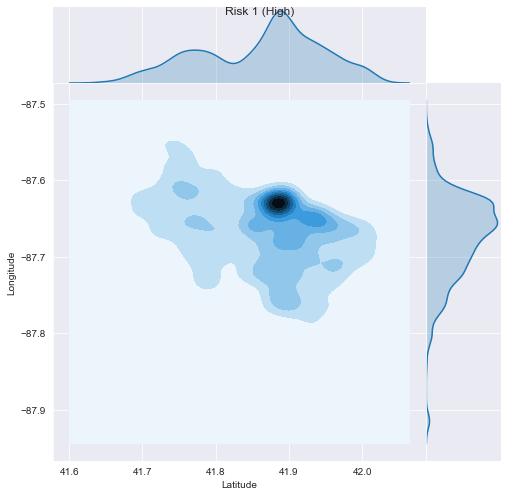

In [215]:
heatmap_plot(data_risk2, color_= 1)

### C.2.1 Low risk

In [216]:
#Create a data Frame containing each unique restaurant
name_data = data_risk3.groupby(["AKA Name","Latitude","Longitude","year"])
#Count the number of inspections by restaurant
name_count = name_data["DBA Name"].count()
name_count = name_count.astype(int)
name_map = pd.DataFrame(name_count)
name_map = name_map.rename(columns={"DBA Name": "Count"})
name_map = name_map.reset_index()
name_map.head()

year_list=[]
for year in data_risk3.year.sort_values().unique():
    year_list.append(name_map.loc[name_map.year == year, ["Latitude","Longitude",]].values.tolist())


np.random.seed(3141592)

data = [ year_list[i][1:1050] for i in range(10)]
weight = 1  # default value
for time_entry in data:
    for row in time_entry:
        row.append(weight)
time_index = [ 2010+k for k in range(10)]
    
m = folium.Map(coord, tiles='stamentoner', zoom_start=12)

hm = plugins.HeatMapWithTime(
    data,
    index=time_index,
    auto_play=True,
    max_opacity=0.3
)

hm.add_to(m)

m

Here the same treatement as above is applied but on the low risk establishments this time.

In [217]:
create_folium_map(data_risk3, save_name='low_risk_map')

C:\Users\marco\Desktop\Python\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


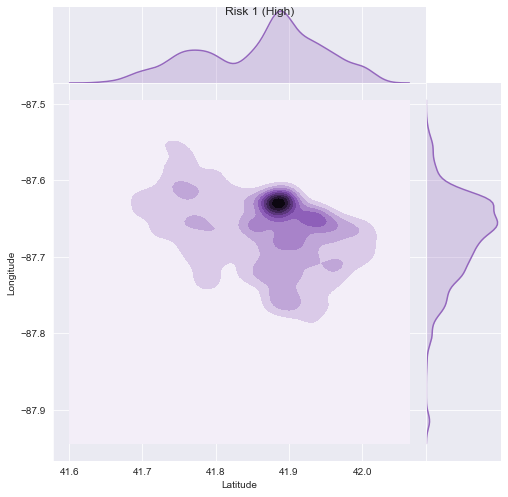

In [218]:
heatmap_plot(data_risk2, color_= 2)

### C.3 Deeper look at violations by Zip codes

In [219]:
zip_data_viol = data_b3.groupby(["Zip","year"])
#Adding mean risk of violations score by Zip
viol_risk = zip_data_viol["Violation risk"].mean()
#Count the number of Violations
value_count = zip_data_viol.count()["index"].values
viol_map = pd.DataFrame(viol_risk)
viol_map["Count"] = value_count
viol_map = viol_map.reset_index()
viol_map["Zip"] = viol_map["Zip"].astype(int)
viol_map["year"] = viol_map["year"].astype(int)
viol_map = viol_map.fillna(0)
viol_map.head()

,Zip,year,Violation risk,Count
0,60148,2012,0.000000,1
1,60406,2011,0.000000,1
2,60501,2012,2.000000,3
3,60601,2010,1.071713,251
4,60601,2011,1.085526,304


We will discard the Zip codes with less than 5 violations per year as they are not significant for our analysis 

In [220]:
new_map=viol_map[viol_map["Count"]>5]
#Create a DataFrame for each year
d = {}
for i in range(9):
    d[i] = new_map[viol_map["year"]==2010+i]
    d[i]=d[i].reset_index().drop("index",axis=1)
    

C:\Users\marco\Desktop\Python\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


In [221]:
### reading of the updated GeoJSON file
geo = r'time_updated-file.json'
coord = [41.88270035458986, -87.63663755997726]
#Create the Folium Map
m = folium.Map(location = coord, tiles='cartodbpositron',zoom_start = 10)
for i in range(8):
    #Create Choropleth layer for each separate year
    cho_layer = folium.features.Choropleth(
        geo_data = geo,
        fill_opacity = 0.7,
        line_opacity = 0.2,  
        data = d[i+1],
        # refers to which key within the GeoJSON to map the ZIP code to
        key_on = 'feature.properties.zip',
        # first element contains location information, second element contains feature of interest
        columns = ["Zip","Violation risk"],
        fill_color = 'BuPu',
        name=2010+i+1,
        overlay = True,
        legend_name = (' ').join("Violation risk".split('_')).title() + ' Number of facilites Across Chigaco')
    #Merge the Legends toghether 
    for key in cho_layer._children:
        if key.startswith("color"):
            del(cho_layer._children[key])
    cho_layer.add_to(m)
violation2010 = folium.features.Choropleth(
    geo_data = geo,
    fill_opacity = 0.7,
    line_opacity = 0.2,  
    data = d[0],
    # refers to which key within the GeoJSON to map the ZIP code to
    key_on = 'feature.properties.zip',
    # first element contains location information, second element contains feature of interest
    columns = ["Zip","Violation risk"],
    fill_color = 'BuPu',
    name="2010",
    legend_name = (' ').join("Violation risk".split('_')).title() + ' Number of facilites Across Chigaco'
).add_to(m)
folium.LayerControl(collapsed=False).add_to(m)
m.save("TimeSliderChoropleth Map.html")

Looking at the map given in (https://github.com/adr1anh/DeepDish/blob/master/TimeSliderChoropleth%Map.html), we can see that the values are in a range of violation score between [0.8,1.5] with clear distinction across district and across year. In fact in 2010, we can see that the Zip codes in the higher part of Chocago near Lake Michigan have in average more serious violations than the lower part of the city. This Zip codes will get lower violations risk in the followings year and diminished there number of serious violations. The Zip codes  [60653 , 60615, 60609] are those than seems to have a higher violation score across the years. These district are also the ones with a higher poverty levels as seen in (https://harforlangning2015.blogspot.com/2017/11/chicago-suburbs-zip-code-map.html) which can explain these result.


# D Predictions

## D.1 Classification and feature importance

In [222]:
data_b3.Results.unique()

array(['Pass', 'Fail', 'Pass w/ Conditions', 'No Entry', 'Not Ready',
       'Out of Business'], dtype=object)

We are interested in predicting the Pass Fail of a business first fitting easy models considering only numerical features and then on a second appraoch using NLP for classification. For this we need to decide what Results from the datasets we want to keep we will do this by putting togheter Pass and Pass with Conditions as a new Pass category and Not Ready Out of Business and Fail togheter as Fail category and discarding the column with result No Entry.


In [223]:
# We construct a data for predictions only as described above
index_pass_cond = data_b3[data_b3["Results"]=='Pass w/ Conditions'].index.values
index_pass = data_b3[data_b3["Results"]=='Pass'].index.values
index_fail = data_b3[data_b3["Results"]=='Fail'].index.values
index_ofb = data_b3[data_b3["Results"]=='Out of Business'].index.values
index_notr = data_b3[data_b3["Results"]=='Not Ready'].index.values
index = np.concatenate((index_pass, index_pass_cond,index_fail,index_ofb,index_notr))
data_predict = data_b3.loc[index].reset_index().drop("index",axis=1)
data_predict.head()

,level_0,Inspection ID,DBA Name,AKA Name,Facility Type,Risk,Inspection Date,Inspection Type,Results,Violations,...,Zip,Name,year,month,day,processed Violations,Violations int,Risk_score,Violation codes,Violation risk
0,0,2182163,JAKE'S PUP IN THE RUF INC,JAKE'S PUP IN THE RUF,restaurant,Risk 1 (High),"[2018, 06, 29]",complaint re-inspection,Pass,"35. WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTR...",...,60640,JAKE'S PUP IN THE RUF,2018,6,29,"[walls, ceilings, attached equipment construct...","[65, 66]",3,"[35, 38]",1
1,1,2182155,RAVENS,RAVENS,restaurant,Risk 3 (Low),"[2018, 06, 29]",complaint re-inspection,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,...,60614,RAVENS,2018,6,29,[food and non-food contact surfaces properly d...,"[67, 68, 69, 65, 66, 70]",1,"[32, 33, 34, 35, 38, 43]",1
2,3,2182173,IRISH AMERICAN HERITAGE CENTER,IRISH AMERICAN HERITAGE CENTER,restaurant,Risk 1 (High),"[2018, 06, 29]",canvass,Pass,32. FOOD AND NON-FOOD CONTACT SURFACES PROPERL...,...,60630,IRISH AMERICAN HERITAGE CENTER,2018,6,29,[food and non-food contact surfaces properly d...,"[67, 68, 71]",3,"[32, 33, 45]",1
3,4,2182168,FAMILY DOLLAR STORE #6594,FAMILY DOLLAR STORE #6594,store,Risk 3 (Low),"[2018, 06, 29]",complaint re-inspection,Pass,,...,60628,FAMILY DOLLAR STORE #6594,2018,6,29,[],[7],1,[],0
4,6,2182166,IZALCO RESTAURANT,IZALCO RESTAURANT,restaurant,Risk 1 (High),"[2018, 06, 29]",canvass re-inspection,Pass,"30. FOOD IN ORIGINAL CONTAINER, PROPERLY LABEL...",...,60623,IZALCO RESTAURANT,2018,6,29,"[food in original container, properly labeled:...","[72, 73, 67, 69, 65, 66, 74, 70]",3,"[30, 31, 32, 34, 35, 38, 40, 43]",1


In [224]:
#Give a numerical value to the Result score to apply Random forest.
data_predict["Results_score"] = data_predict["Results"].replace(to_replace =["Pass", "Pass w/ Conditions", "Fail",'Out of Business','Not Ready'],  
                            value =[1,1,3,3,3])
features = data_predict[["Violation risk"]]#"Violation risk"
pred = data_predict["Results_score"]


In [225]:
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import median_absolute_error, r2_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier as RF
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
import matplotlib.pyplot as plt  # doctest: +SKIP
from sklearn import datasets, metrics, model_selection, svm
from scipy import interp
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_fscore_support

We decide to use Random forest Algorithm since in works well for binary classification and has a build in feature importance function that will permit us to look into detail at which violations has the greater importance for an inspection 

In [226]:
#Use the function to split our data in train and test set
X_train, X_test, y_train, y_test = train_test_split(features,pred, test_size=0.30, random_state=1)
rfr = RF(n_estimators = 100, min_samples_leaf=1/50 , max_features = 0.5)
#fit the model
model_RF = rfr.fit(X_train,y_train)
res = rfr.predict(X_test)

In [227]:
print("The precision recall and F1-score are respectively given by")
display(precision_recall_fscore_support(y_test, res,average = "weighted", sample_weight=None))

The precision recall and F1-score are respectively given by


(0.9188391211397248, 0.8833397390970134, 0.8909335695526757, None)

In [228]:
print("The confusion matrix is given by")
confusion_matrix(y_test,res)

The confusion matrix is given by


array([[30244,  4856],
       [  304,  8827]], dtype=int64)

## D.2 Time Series Predictions


### D.2.1 Study of the Data

In [229]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.graphics.api import qqplot
from statsmodels.compat import lzip
from statsmodels.tsa.seasonal import seasonal_decompose

In this case we follow the same methodology as in section D.1 but we do not consider only the data before July 2018 but the full clean dataset obtain in Section A.

In [230]:
# We construct a data for Forecasting only similar to the predictions
index_pass_cond = data_removed[data_removed["Results"]=='Pass w/ Conditions'].index.values
index_pass = data_removed[data_removed["Results"]=='Pass'].index.values
index_fail = data_removed[data_removed["Results"]=='Fail'].index.values
index_ofb = data_removed[data_removed["Results"]=='Out of Business'].index.values
index_notr = data_removed[data_removed["Results"]=='Not Ready'].index.values
index = np.concatenate((index_pass, index_pass_cond,index_fail,index_ofb,index_notr))
data_forecast = data_removed.loc[index].reset_index().drop("index",axis=1)
#Group the Result on Pass and Fail.
data_forecast["Results_Name"] = data_forecast["Results"].replace(to_replace =["Pass", "Pass w/ Conditions", "Fail",'Out of Business','Not Ready'],  
                            value =["Pass","Pass","Fail","Fail","Fail"])


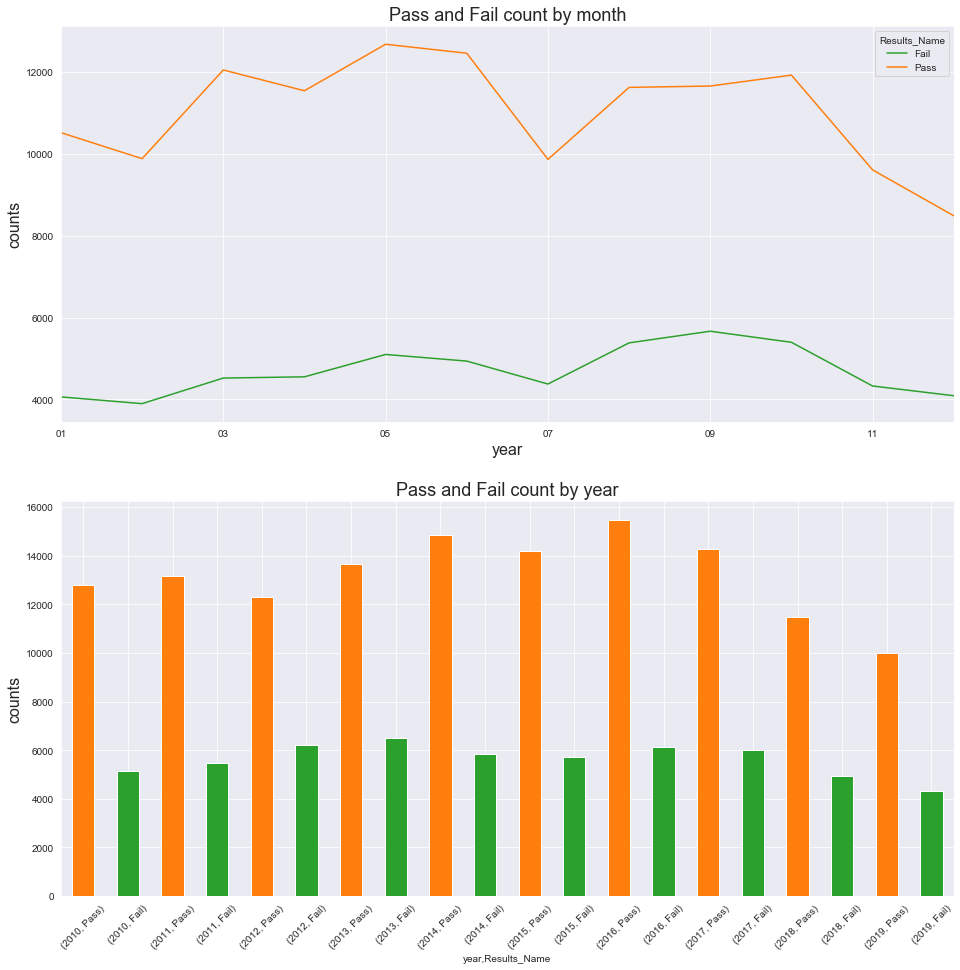

In [231]:
#Create a table with the value counts of Pass and Fail
table = data_forecast.groupby(['year'])["Results_Name"].value_counts()
#Plot result in function of year and months 
fig,ax=plt.subplots(2,1,figsize=(16,16))

#Plot 1
data_forecast.groupby(['month','Results_Name'])['Inspection ID'].agg('count').unstack('Results_Name').plot(ax = ax[0], color= ['C2','C1'])
ax[0].set_title("Pass and Fail count by month",size=18)
ax[0].set_ylabel('counts',size=16)
ax[0].set_xlabel('year',size=16)

#Plot 2
table.plot(kind = 'bar', color= ['C1','C2'], ax = ax[1])
ax[1].tick_params(axis='x',labelrotation=360)
ax[1].set_title("Pass and Fail count by year",size=18)
ax[1].set_ylabel('counts',size=16)
plt.xticks(rotation=45)

plt.show()

We can see that there is a small seasonality in the data as explained in the explanatory data analysis. We have that there are higher number of inspections in March and in July the percentage of the inspections that are getting passed are lower compared to any other month. Furthermore we can see a downward trend of fail exams in the last 3 years. We will be interested in studying the percentage of Fail exams in the following 2020 year. We will thus need to create a Time Series containing the percentage in each month

In [232]:
#Create a table with count of Pass and Fail in each monh
table_ts_sum = data_forecast.groupby(['year',"month"])["Results_Name"].count()
#Create a table with count of Fail at each month to look more in detail
table_ts = data_forecast.groupby(['year',"month"])["Results_Name"].value_counts()
df_ts = pd.DataFrame(table_ts).rename(columns={"Results_Name":"Count"}).reset_index()
df_ts = df_ts[df_ts["Results_Name"]=="Fail"].drop("Results_Name",axis=1).reset_index(drop=True)
df_ts["Percentage"] = (df_ts["Count"].values/table_ts_sum.values)*100
df_ts.tail()

,year,month,Count,Percentage
114,2019,07,404,30.699088
115,2019,08,467,32.771930
116,2019,09,404,34.412266
117,2019,10,394,32.401316
118,2019,11,48,30.188679


In [233]:
#Create a Time Series containing only the percentage at datetime index
series = pd.Series((df_ts["Percentage"].values), index=pd.date_range('1-2-2010', periods=len(df_ts), freq='M'), name = 'Fail Count')
series.describe()

count    119.000000
mean      29.868063
std        3.024679
min       23.341837
25%       27.973076
50%       29.582449
75%       31.456464
max       39.893874
Name: Fail Count, dtype: float64

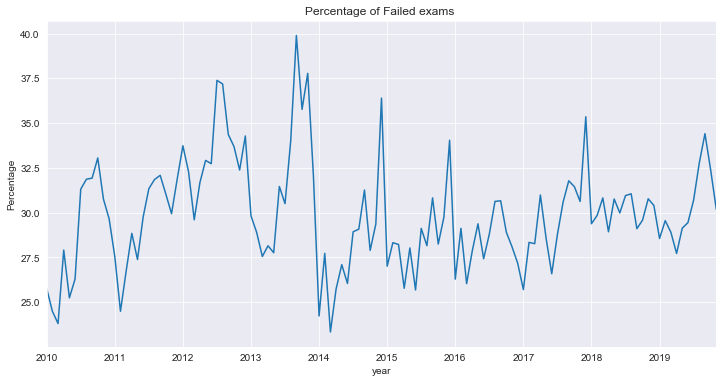

In [234]:
series.plot.line(figsize=(12,6))
plt.title("Percentage of Failed exams ")
plt.ylabel('Percentage')
plt.xlabel('year')
plt.show()

Having taken the Percentage it seems that we have removed the trend in count value of failed exams. We can still see the clear seasonality expalained in the above Figure. We will look at this in greater detail using a seasonal decomposition

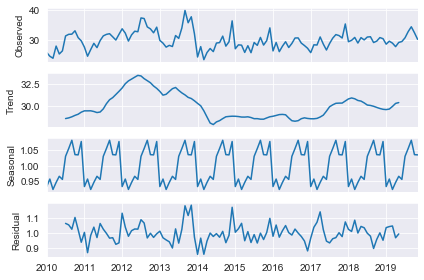

In [235]:
result = seasonal_decompose(series,model="multiplicative")
#plt.figure(figsize=(12,6))
result.plot()
plt.show()

We can see clearly that we need to find a model that will take this seasonality of period 12 that need to be taken into account

### D.2.2 Holt’s Winters Seasonal model


We look at Exponential Smoothing Method. These methods are interesting as contrary to classical time series method they consider a weighted averages of past observations to forecast new values. Here, the idea is to give more importance to recent values in the series. Thus, as observations get older (in time), the importance of these values get exponentially smaller. Exponential Smoothing Methods combine Error, Trend, and Seasonal components in a smoothing calculation.  Each term can be combined either additively, multiplicatively or be left out of the model. We will compare different model and choose the one with the lower AIC score. 

In [236]:
#No trend and multiplicative seasonality
fit1 = ExponentialSmoothing(series, seasonal_periods=12, seasonal='mul').fit(use_boxcox=True)
#Additive trend and multiplicative seasonality
fit2 = ExponentialSmoothing(series, seasonal_periods=12, trend='add', seasonal='mul',damped=True).fit(use_boxcox=True)
#Additive trend and additive seasonality
fit3 = ExponentialSmoothing(series, seasonal_periods=12, trend='add', seasonal='add', damped=True).fit(use_boxcox=True)
#Multiplicative trend and multiplicative seasonality
fit4 = ExponentialSmoothing(series, seasonal_periods=12, trend='mul', seasonal='mul', damped=True).fit(use_boxcox=True)

Comparing the AIC we have that no trend and multiplicative seasonality gives the best model for our data with print the summary of the model below

In [237]:
fit1.summary()

Dep. Variable:,endog,No. Observations:,119
Model:,ExponentialSmoothing,SSE,471.486
Optimized:,True,AIC,191.835
Trend:,None,BIC,230.743
Seasonal:,Multiplicative,AICC,197.168
Seasonal Periods:,12,Date:,"Wed, 18 Dec 2019"
Box-Cox:,True,Time:,16:00:14
Box-Cox Coeff.:,-0.66753,,
,coeff,code,optimized
smoothing_level,0.5170290,alpha,True
smoothing_seasonal,0.000000,gamma,True


C:\Users\marco\Desktop\Python\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
  after removing the cwd from sys.path.


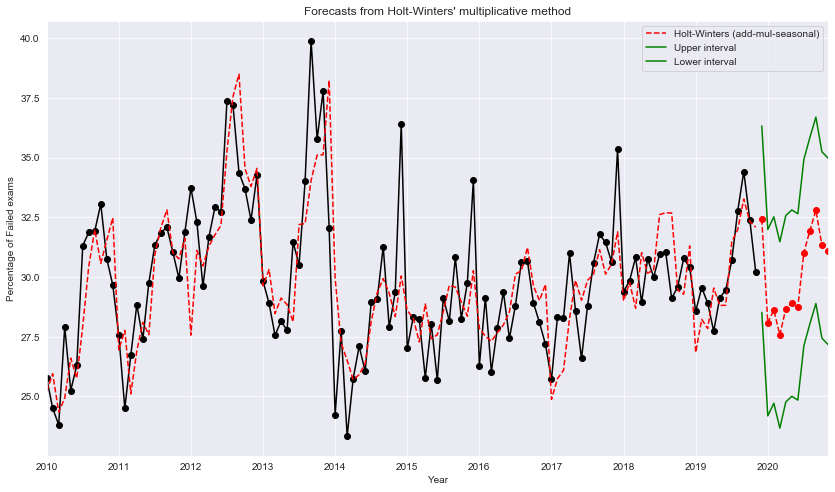

In [238]:
#Plot the fit of the model as well as the predictions 
ax = series.plot(figsize=(14,8), marker='o', color='black', title="Forecasts from Holt-Winters' multiplicative method" )
fcast1= fit1.forecast(12).rename("Holt-Winters (add-mul-seasonal)")
xhat = fcast1.get_values()
#Create manually the confidence interval
z = 1.96
sse = fit1.sse
predint_xminus = xhat - z * np.sqrt(sse/len(series))
predint_xplus  = xhat + z * np.sqrt(sse/len(series))
index_for=pd.date_range('2019-12-30', periods=(12), freq='M')
d = {"Upper interval": predint_xplus , "Lower interval":predint_xminus }
#DataFrame containing upper and lower confidence intevral
conf_int = pd.DataFrame(data=d,index=index_for)
ax.set_ylabel("Percentage of Failed exams")
ax.set_xlabel("Year")
fit1.fittedvalues.plot(ax=ax, style='--', color='red')
#Plot our predictions
fit1.forecast(12).rename('Holt-Winters (add-mul-seasonal)').plot(ax=ax, style='--', marker='o', color='red', legend=True)

# upper 95% prediction interval
conf_int.plot(y="Upper interval",ax=ax, color="green")
# lower 95% prediction interval
conf_int.plot(y="Lower interval",ax=ax, color="green")

plt.show()


We can see that our model seem to fit correctly the data with some difficulties to get the very high picks in the percentage but does capture part of the seasonality in the data. We can see that the prediction in percentage should remain between [27.5%,35%] for the following year we a decrease in the beggining of the year and the a pike during July and August.

C:\Users\marco\Desktop\Python\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


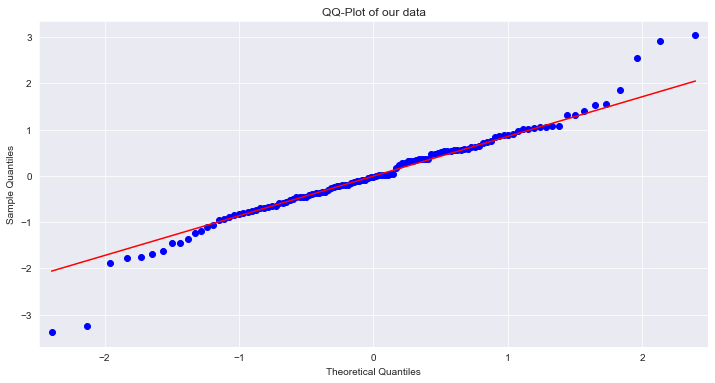

In [239]:
# We look at the qq-plot of our residuals
resid = fit2.resid
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
fig = qqplot(resid, line='q', ax=ax, fit=True)
plt.title("QQ-Plot of our data")
plt.show()

Hence we can study the goodness of fit by looking at the residuals of the model. We can see that in the Figure below that our residuals are well normally distributed with this model. We can see that there are some outliers in the data that our models fails to predict but we can still consider the assumption of normality. 

# E NLP Insigth